**OBJECTIVE:** Fit OPLRAreg algorithm to OSM-S4 qsar dataset

In [1]:
import math
import scipy
import numpy as np
import pandas as pd

import oplrareg
from oplrareg import OplraRegularised

# Import relevant modSAR classes 
import modSAR
from modSAR.dataset import QSARDataset, QSARDatasetIO

from rdkit import Chem
from rdkit.Chem import AllChem
import rdkit.Geometry
from rdkit.Chem import rdFMCS, PandasTools
from rdkit.Chem.Draw import IPythonConsole 

from copy import deepcopy
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.model_selection import RandomizedSearchCV

# 2.5uM in Log units
CUTOFF_ACTIVITY = - np.log10(2.5e-06)

%matplotlib inline

# Load Data

Here we load the two versions of the OSM-S4 dataset which were created in the Notebook 01.

Datasets are loaded by `QSARDatasetIO` (from the `modSAR` package) and are stored internally as a `QSARDataset` object. This is simply to have a more standard way to represent QSAR datasets, it is not mandatory. 

Alternatively, one could just simply load the CSV files as pandas DataFrames and pass the respective feature and output columns to the algorithms, as it is done usually in scikit-learn.

## OSM-S4 CDK

Molecular descriptors calculated from CDK library were used as features

In [4]:
osm4_dataset_cdk = \
    QSARDatasetIO.load(dataset_name='OSM4',
                   activity_sheetname='activity',
                   smiles_column='Canonical_Smiles',
                   id_column='OSM_ID',
                   filepath='/mnt/data/OSM-S4/osm4_qsardataset_cdk.xls',
                   calculate_similarity=False)
    

    
osm4_dataset_cdk

QSARDataset OSM4 
 -- Samples : 347
 -- Features:  219

** Visualize samples from the dataset **

,Canonical_Smiles,Molecule,BCUTw-1l,BCUTw-1h,BCUTc-1l,BCUTc-1h,BCUTp-1l,BCUTp-1h
OSM_ID,,,,,,,,
OSM-A-1,Cc1cc(\C=C\2/S\C(=N/c3ccccc3)\NC2=O)c(C)n1c4cc...,,11.999000,31.973471,-0.274041,0.263358,5.597575,11.920713
OSM-A-2,Cc1cc(\C=C\2/S\C(=N/c3ccccc3)\NC2=O)c(C)n1c4cc...,,11.952893,31.972072,-0.423222,0.319497,4.213477,11.909443
OSM-A-3,Cc1cc(\C=C\2/S\C(=N/c3ccccc3)\NC2=O)c(C)n1c4cc...,,11.850000,126.904473,-0.274002,0.243764,5.598634,12.135745

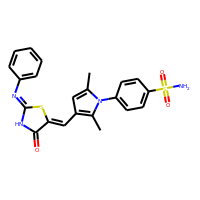
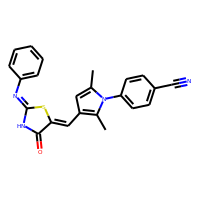
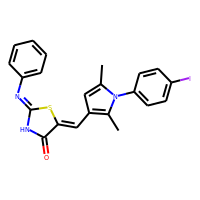

In [109]:
from rdkit.Chem import PandasTools

sample = osm4_dataset_cdk.metadata.iloc[0:3,:][["Canonical_Smiles"]].copy()
PandasTools.AddMoleculeColumnToFrame(sample,'Canonical_Smiles','Molecule',includeFingerprints=True)

sample = pd.merge(sample, osm4_dataset_cdk.X.iloc[:,0:6], how="left", left_index=True, right_index=True)

sample

**NOTE: There were some entries (rows) with NaN values:**

In [99]:
sum(osm4_dataset_cdk.X.isnull().sum(axis=1) > 0)

2

## OSM-S4 ECFP4

ECFP4 fingerprints calculated with RDKit were used as features

In [2]:
osm4_dataset_ecfp4 = \
    QSARDatasetIO.load(dataset_name='OSM4',
                   activity_sheetname='activity',
                   smiles_column='Canonical_Smiles',
                   id_column='OSM_ID',
                   filepath='/mnt/data/OSM-S4/osm4_qsardataset_ecfp4.xls',
                   calculate_similarity=False)
    

    
osm4_dataset_ecfp4

QSARDataset OSM4 
 -- Samples : 347
 -- Features:  1024

**Are there any missing values?** No :)

In [3]:
sum(osm4_dataset_ecfp4.X.isnull().sum(axis=1) > 0)

0

**Visualize a sample of the dataset**

,Canonical_Smiles,Molecule,Bit_0000,Bit_0001,Bit_0002,Bit_0003,Bit_1022,Bit_1023
OSM_ID,,,,,,,,
OSM-A-1,Cc1cc(\C=C\2/S\C(=N/c3ccccc3)\NC2=O)c(C)n1c4cc...,,0,0,0,0,0,0
OSM-A-2,Cc1cc(\C=C\2/S\C(=N/c3ccccc3)\NC2=O)c(C)n1c4cc...,,0,0,0,0,0,0
OSM-A-3,Cc1cc(\C=C\2/S\C(=N/c3ccccc3)\NC2=O)c(C)n1c4cc...,,0,0,0,0,0,0

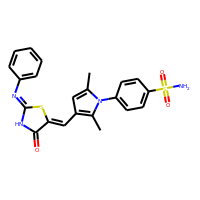
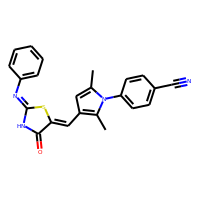
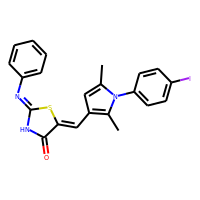

In [4]:
from rdkit.Chem import PandasTools

sample = osm4_dataset_ecfp4.metadata.iloc[0:3,:][["Canonical_Smiles"]].copy()
PandasTools.AddMoleculeColumnToFrame(sample,'Canonical_Smiles','Molecule',includeFingerprints=True)

sample = pd.merge(sample, osm4_dataset_ecfp4.X.iloc[:,[0, 1, 2, 3, 1022, 1023]], 
                  how="left", left_index=True, right_index=True)

sample

# Fit OPLRAreg to OSM S4 - CDK features

Using CDK molecular descriptors as features

## Prepare

There were missing values in some columns, so we need to remove those.

**Identify the invalid columns**

In [6]:
from copy import deepcopy

In [7]:
osm4_dataset_cdk_test01 = deepcopy(osm4_dataset_cdk)

invalid_cols = osm4_dataset_cdk_test01.X.apply(lambda x: any(x.isnull()), axis=0)
invalid_cols = osm4_dataset_cdk_test01.X.columns[invalid_cols]

invalid_cols

Index(['BCUTw-1l', 'BCUTw-1h', 'BCUTc-1l', 'BCUTc-1h', 'BCUTp-1l', 'BCUTp-1h', 'ATSc1', 'ATSc2', 'ATSc3', 'ATSc4', 'ATSc5'], dtype='object')

**Remove these features**

In [8]:
osm4_dataset_cdk_test01.X = osm4_dataset_cdk_test01.X.drop(columns=invalid_cols)
osm4_dataset_cdk_test01.X_norm = osm4_dataset_cdk_test01.X_norm.drop(columns=invalid_cols)
osm4_dataset_cdk_test01.number_features = len(osm4_dataset_cdk_test01.X.columns)
osm4_dataset_cdk_test01

QSARDataset OSM4 
 -- Samples : 347
 -- Features:  208

## Cross-validation

To perform cross-validation, first we need to instantiate the OplraRegularised algorithm with its default parameters

In [8]:
oplra_test01 = OplraRegularised(solver_name="cplex", epsilon=0.01, beta=0.03)

Then we can perform cross-validation. The only parameter we need to tune is $\lambda$ - the regularisation penalty as described in our [paper](https://onlinelibrary.wiley.com/doi/abs/10.1002/minf.201800028).

Here, I am using Randomised Grid Search to search for this parameter. Good results are found typically for $\lambda \approx 0.005$, so our random search will draw from a Gaussian distribution searching for values around $\lambda \sim N(\mu=0.005, \sigma=0.003)$.

In [21]:
from sklearn.model_selection import RandomizedSearchCV
import scipy.stats

scoring = ["neg_mean_absolute_error", "neg_mean_squared_error", "r2"]

param_distributions = {"lam": scipy.stats.norm(0.005, 0.003)}


oplra_cdk_results = RandomizedSearchCV(oplra_test01, 
                            return_train_score=True,
                            param_distributions=param_distributions, 
                            scoring=scoring, 
                            refit="neg_mean_squared_error",
                            n_jobs=4)

In [23]:
oplra_cdk_results.fit(osm4_dataset_cdk_test01.X, osm4_dataset_cdk.y["pIC50"])

/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=-0.0006291410486834806, solver_name='cplex')
########## R = 1
SELECTED FEATURES:
[]



RandomizedSearchCV(cv='warn', error_score='raise-deprecating',
                   estimator=OplraRegularised(beta=0.03, epsilon=0.01,
                                              exact_number_regions=None,
                                              lam=0.005, solver_name='cplex'),
                   iid='warn', n_iter=10, n_jobs=4,
                   param_distributions={'lam': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f6a26835128>},
                   pre_dispatch='2*n_jobs', random_state=None, refit='r2',
                   return_train_score=True,
                   scoring=['neg_mean_absolute_error', 'neg_mean_squared_error',
                            'r2'],
                   verbose=0)

## Evaluate fitting

Best-performing parameter was $\lambda \approx -0.0006$, a negative value - which was very weird. We haven't tested this algorithm with negative lambdas before.

In [45]:
oplra_cdk_results_df = pd.DataFrame(oplra_cdk_results.cv_results_)

selected_cols = [col for col in oplra_cdk_results_df.columns if 'split' not in col and 'std' not in col]
oplra_cdk_results_df.loc[:, selected_cols].sort_values("param_lam")

,mean_fit_time,mean_score_time,param_lam,params,mean_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,mean_train_neg_mean_absolute_error,mean_test_neg_mean_squared_error,rank_test_neg_mean_squared_error,mean_train_neg_mean_squared_error,mean_test_r2,rank_test_r2,mean_train_r2
2,2.435848,0.006454,-0.000629141,{'lam': -0.0006291410486834806},-0.706152,1,-0.678882,-0.837133,1,-0.785886,-0.298773,1,-0.103683
9,597.239564,0.134172,0.00091345,{'lam': 0.0009134501471451178},-2.755760,9,-0.092022,-39.081573,9,-0.071460,-74.968125,9,0.903354
4,602.031087,0.263639,0.0024528,{'lam': 0.002452799209460861},-2.917180,10,-0.127857,-41.484875,10,-0.097316,-79.240264,10,0.866215
7,381.516970,0.228841,0.00394146,{'lam': 0.0039414606738832625},-1.893830,8,-0.225736,-13.246858,8,-0.192238,-12.415961,8,0.747941
1,326.448369,0.150366,0.00452462,{'lam': 0.0045246154689371374},-1.850835,7,-0.233627,-11.615894,7,-0.198790,-10.791737,7,0.739787
5,394.157851,0.195726,0.00481424,{'lam': 0.00481424060477829},-1.755715,6,-0.230847,-9.077528,5,-0.197948,-9.076535,5,0.739395
8,344.988970,0.148382,0.00525164,{'lam': 0.0052516359666386},-1.659462,4,-0.241757,-9.209485,6,-0.207022,-8.565767,4,0.725810
3,316.282261,0.158070,0.00533593,{'lam': 0.005335929593347421},-1.673422,5,-0.241676,-8.985437,4,-0.204719,-9.398537,6,0.727890
6,348.440563,0.320649,0.00799659,{'lam': 0.00799659033528672},-1.505649,3,-0.224187,-6.100435,3,-0.185611,-5.606077,3,0.748474
0,76.790034,0.076905,0.00894265,{'lam': 0.008942646265325024},-0.785495,2,-0.331935,-1.119311,2,-0.291842,-0.481235,2,0.582173


Let us save the grid-search model in case we want to use it later:

In [147]:
import joblib

joblib.dump(oplra_cdk_results, "/mnt/data/results_cdk.joblib")

['/mnt/data/results_cdk.joblib']

## Analysis

This model only produced a single equation - which was not all useful:

`y = 5.05`

In [42]:
oplra_cdk_results.best_estimator_.get_model_info()

(   region         B
 0       0  5.053057,   fStar breakpoints
 0  None        None)

In [35]:
y_predicted = oplra_cdk_results.best_estimator_.predict(osm4_dataset_cdk_test01.X)

/opt/conda/lib/python3.6/site-packages/oplrareg/models.py:165: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  for r in self.r


In [36]:
error = y_predicted - osm4_dataset_cdk_test01.y["pIC50"]

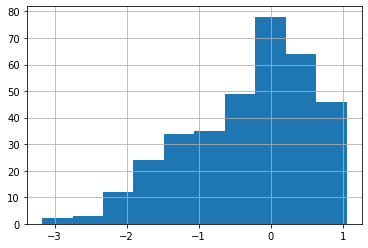

In [37]:
pd.Series(error).hist()

In [38]:
print("Mean absolute error: %.2f | R2-score: %.2f" % 
      (mean_absolute_error(osm4_dataset_cdk_test01.y, y_predicted), 
       r2_score(osm4_dataset_cdk_test01.y, y_predicted)))

Mean absolute error: 0.68 | R2-score: -0.14


In [148]:
np.mean(osm4_dataset_cdk_test01.y["pIC50"])

5.3726040547003

**The equation is almost like fitting the average IC50 of the dataset. Not a good model.**

# Fit OPLRAreg to OSM S4 - ECFP4 features

This dataset consists of 1024 bits (1024 columns) generated from ECFP4 fingerprints. OPLRAreg does not cope well with large number of features so it is expected to take quite some time.

## Cross-validation

Here we search for lambda around $\lambda \sim N(\mu=0.01, \sigma=0.004)$ - to avoid the chance of negative values.

In [5]:
oplra_test01 = OplraRegularised(solver_name="cplex", epsilon=0.01, beta=0.03)

scoring = ["neg_mean_absolute_error", "neg_mean_squared_error", "r2"]
param_distributions = {"lam": scipy.stats.norm(0.01, 0.004)}


results_ecfp4 = RandomizedSearchCV(oplra_test01, 
                                   return_train_score=True,
                                   param_distributions=param_distributions, 
                                   scoring=scoring, 
                                   refit="neg_mean_squared_error",
                                   cv=5,
                                   n_jobs=5)

In [6]:
results_ecfp4.fit(osm4_dataset_ecfp4.X, osm4_dataset_ecfp4.y["pIC50"])

/opt/conda/lib/python3.6/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 1
SELECTED FEATURES:
['Bit_0001', 'Bit_0003', 'Bit_0007', 'Bit_0015', 'Bit_0020', 'Bit_0025', 'Bit_0033', 'Bit_0036', 'Bit_0061', 'Bit_0090', 'Bit_0099', 'Bit_0101', 'Bit_0114', 'Bit_0128', 'Bit_0135', 'Bit_0138', 'Bit_0139', 'Bit_0155', 'Bit_0162', 'Bit_0178', 'Bit_0198', 'Bit_0208', 'Bit_0213', 'Bit_0228', 'Bit_0231', 'Bit_0263', 'Bit_0273', 'Bit_0279', 'Bit_0281', 'Bit_0285', 'Bit_0296', 'Bit_0297', 'Bit_0310', 'Bit_0323', 'Bit_0324', 'Bit_0361', 'Bit_0366', 'Bit_0368', 'Bit_0371', 'Bit_0389', 'Bit_0390', 'Bit_0392', 'Bit_0402', 'Bit_0410', 'Bit_0415', 'Bit_0449', 'Bit_0463', 'Bit_0478', 'Bit_0482', 'Bit_0504', 'Bit_0528', 'Bit_0539', 'Bit_0543', 'Bit_0547', 'Bit_0551', 'Bit_0557', 'Bit_0559', 'Bit_0612', 'Bit_0624', 'Bit_0625', 'Bit_0639', 'Bit_0647', 'Bit_0650', 'Bit_0659', 'Bit_0691', 'Bit_0694', 'Bit_0703', 'Bit_0715', 'Bit_0724', 'B


OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 2 f* = Bit_0368 (loop 38/95) ###########

OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 2 f* = Bit_0371 (loop 39/95) ###########

OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 2 f* = Bit_0389 (loop 40/95) ###########

OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 2 f* = Bit_0390 (loop 41/95) ###########

OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 2 f* = Bit_0392 (loop 42/95) ###########

OplraRegularised(beta=0.03, epsilon=0.01, exact_n


OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 2 f* = Bit_0877 (loop 82/95) ###########

OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 2 f* = Bit_0879 (loop 83/95) ###########

OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 2 f* = Bit_0890 (loop 84/95) ###########

OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 2 f* = Bit_0896 (loop 85/95) ###########

OplraRegularised(beta=0.03, epsilon=0.01, exact_number_regions=None,
                 lam=0.014629692804126824, solver_name='cplex')
########## R = 2 f* = Bit_0915 (loop 86/95) ###########

OplraRegularised(beta=0.03, epsilon=0.01, exact_n

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
                   estimator=OplraRegularised(beta=0.03, epsilon=0.01,
                                              exact_number_regions=None,
                                              lam=0.005, solver_name='cplex'),
                   iid='warn', n_iter=10, n_jobs=5,
                   param_distributions={'lam': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f998e590a90>},
                   pre_dispatch='2*n_jobs', random_state=None,
                   refit='neg_mean_squared_error', return_train_score=True,
                   scoring=['neg_mean_absolute_error', 'neg_mean_squared_error',
                            'r2'],
                   verbose=0)

In [7]:
import joblib

joblib.dump(results_ecfp4, "/mnt/data/results_ecfp4.joblib")

['/mnt/data/results_ecfp4.joblib']

## Evaluate fitting

Best lambdas were around $\lambda = 0.015$

In [8]:
results_df = pd.DataFrame(results_ecfp4.cv_results_)

selected_cols = [col for col in results_df.columns if 'split' not in col and 'std' not in col]
results_df.loc[:, selected_cols].sort_values("param_lam")

,mean_fit_time,mean_score_time,param_lam,params,mean_test_neg_mean_absolute_error,rank_test_neg_mean_absolute_error,mean_train_neg_mean_absolute_error,mean_test_neg_mean_squared_error,rank_test_neg_mean_squared_error,mean_train_neg_mean_squared_error,mean_test_r2,rank_test_r2,mean_train_r2
6,1452.064031,0.051861,0.00479229,{'lam': 0.004792292264424289},-0.729057,5,-0.076371,-0.882349,4,-0.052663,-0.334420,8,0.927676
9,1241.549551,0.040724,0.00567261,{'lam': 0.005672613812661977},-0.707932,3,-0.094471,-0.852302,3,-0.066739,-0.293226,5,0.908024
7,797.257614,0.055652,0.00850761,{'lam': 0.008507612522071696},-0.760216,10,-0.167062,-1.006599,10,-0.123371,-0.357981,10,0.829247
4,740.689006,0.051498,0.00895539,{'lam': 0.008955394903122263},-0.738621,7,-0.174820,-0.950094,7,-0.125298,-0.304482,6,0.826608
0,741.945594,0.058792,0.0091582,{'lam': 0.009158196826275326},-0.731022,6,-0.181816,-0.935336,6,-0.130957,-0.276797,4,0.818673
3,662.818637,0.050819,0.00978883,{'lam': 0.009788828697598768},-0.744009,8,-0.191623,-0.979147,8,-0.139082,-0.327906,7,0.807397
5,537.376088,0.055476,0.0110093,{'lam': 0.011009345960485941},-0.756931,9,-0.213888,-1.005978,9,-0.155826,-0.345819,9,0.783814
1,363.221723,0.052362,0.0140978,{'lam': 0.014097787205094988},-0.720299,4,-0.274032,-0.900767,5,-0.210704,-0.234870,3,0.706640
8,319.653220,0.062513,0.0146297,{'lam': 0.014629692804126824},-0.675550,1,-0.291628,-0.807181,1,-0.228233,-0.123632,1,0.680866
2,271.855594,0.059678,0.015366,{'lam': 0.015365962183737612},-0.681383,2,-0.297731,-0.821560,2,-0.232049,-0.124461,2,0.675952


In [9]:
y_predicted = results_ecfp4.predict(osm4_dataset_ecfp4.X)

/opt/conda/lib/python3.6/site-packages/oplrareg/models.py:165: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  for r in self.r


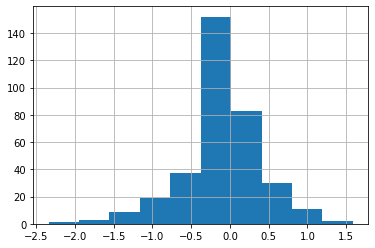

In [10]:
error = y_predicted - osm4_dataset_ecfp4.y["pIC50"]
pd.Series(error).hist()

In [11]:
print("Mean absolute error: %.2f | R2-score: %.2f" % 
      (mean_absolute_error(osm4_dataset_ecfp4.y, y_predicted), 
       r2_score(osm4_dataset_ecfp4.y, y_predicted)))

Mean absolute error: 0.33 | R2-score: 0.65


**This model have a much better fit to the data than previous ones, indicating that ECFP4 fingerprints are much more suitable for this problem.**

## Analysis of piecewise models

In [12]:
coeff, breakpoints = results_ecfp4.best_estimator_.get_model_info()

In [13]:
def get_linear_equation(row):
    coeffs = ['%+.2f %s' % (val, coeff) for coeff, val in row.iteritems() 
              if not (math.isnan(val) or float(val) == 0) and coeff != 'B']
    equation_str = ' '.join(coeffs)
    equation_str += " %+.2f" % row['B']    
    return equation_str  

def print_module_equations(coeffs, module):
    """Helper function to print a clean representation of piecewise equations for informed module"""
    
    coeffs = coeffs.query('module == "%s"' % module)

    for idx, row in coeffs.groupby(['module', 'region']):
        equation = get_linear_equation(row.drop(columns=['module', 'region']))
        print('Equations for Module %s | Region %d\n' % idx)
        print("pIC50 = ", equation)
        print()

## Breakpoint: Bit 451

Essentially, the model separates the data into two subsets:

1. Molecules that do not have Bit 451
2. Molecules that do have Bit 451

In [14]:
breakpoints

,fStar,breakpoints
0,Bit_0228,0.01


There are only 9 molecules that have this bit ON:

In [15]:
osm4_dataset_ecfp4.X["Bit_0228"].value_counts()

0    341
1      6
Name: Bit_0228, dtype: int64

Which chemical compounds have this bit ON? And what do they have in common?

In [16]:
# Select molecules with Bit_0451 ON

bit0451_mols = np.argwhere(osm4_dataset_ecfp4.X["Bit_0228"].values == 1).flatten()
bit0451_mols

array([ 60,  62,  63, 274, 299, 318])

### Common core

What do these molecules have in common?

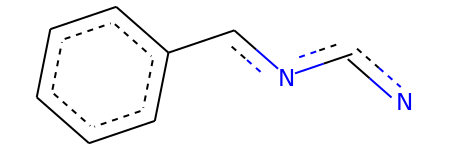

In [59]:
selected_mols = osm4_dataset_ecfp4.metadata.iloc[bit0451_mols,:]["Canonical_Smiles"]
rdkit_mols = [Chem.MolFromSmiles(mol) for mol in selected_mols]

res = rdFMCS.FindMCS(rdkit_mols)
pattern = Chem.MolFromSmarts(res.smartsString)
pattern

In [18]:
AllChem.Compute2DCoords(pattern)
for m in rdkit_mols:
    AllChem.GenerateDepictionMatching2DStructure(m,pattern)

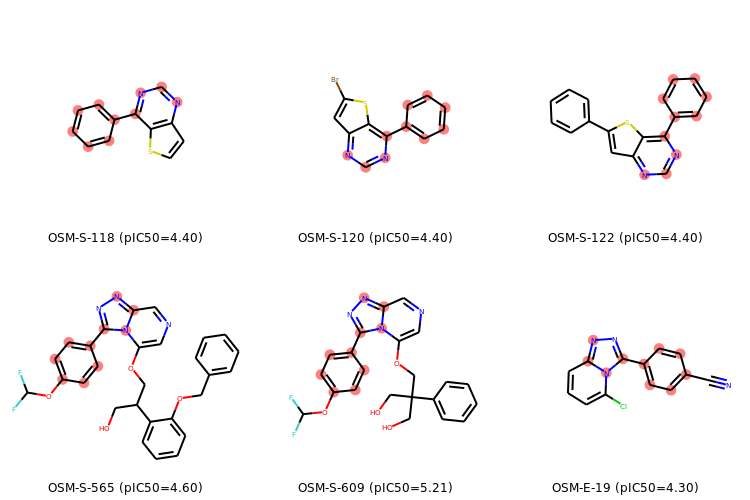

In [60]:
from rdkit.Chem import Draw

labels = ["%s (pIC50=%.2f)" % (label, osm4_dataset_ecfp4.y.loc[label]) for label in selected_mols.index]

Draw.MolsToGridImage(rdkit_mols,legends=labels,
                     highlightAtomLists=[rdkit_mols[i].GetSubstructMatch(pattern) 
                                         for i in range(len(rdkit_mols))] ,
                     subImgSize=(250,250), useSVG=False)

### What is Bit 451 anyways?

In [61]:
from ipywidgets import interact,fixed,IntSlider
def renderFpBit(mol,bitIdx,bitInfo,fn):
    bid = bitIdx
    return(display(fn(mol,bid,bitInfo)))


bi = {}
fp = AllChem.GetMorganFingerprintAsBitVect(rdkit_mols[0], radius=4, nBits=1024, bitInfo=bi)


bits = list(bi.keys())
# img2 = Draw.DrawMorganBit(m2, 999, bi)

interact(renderFpBit, bitIdx=list(bi.keys()),mol=fixed(rdkit_mols[0]),
         bitInfo=fixed(bi),fn=fixed(Draw.DrawMorganBit));

interactive(children=(Dropdown(description='bitIdx', options=(14, 64, 73, 99, 131, 136, 175, 202, 205, 207, 228, 252, 255, 256, 258, 276, 323, 356, 359, 370, 378, 389, 427, 428, 471, 489, 498, 543, 554, 604, 675, 677, 719, 726, 736, 751, 786, 796, 849, 871, 874, 923, 934, 947), value=14), Output()), _dom_classes=('widget-interact',))

## Piecewise Equations

In [23]:
for idx, row in coeff.groupby(['region']):
    equation = get_linear_equation(row.drop(columns=['region']))
    print('Equations for Region %d\n' % idx)
    print("pIC50 = ", equation)
    print()

Equations for Region 0

pIC50 =  -0.13 Bit_0003 -0.08 Bit_0015 +0.01 Bit_0025 -0.04 Bit_0033 +0.11 Bit_0036 +0.14 Bit_0061 +0.26 Bit_0090 +0.16 Bit_0099 +0.14 Bit_0114 -0.13 Bit_0128 +0.05 Bit_0135 +0.14 Bit_0138 -0.21 Bit_0139 +0.21 Bit_0155 -0.08 Bit_0162 -0.03 Bit_0178 -0.04 Bit_0198 -0.11 Bit_0213 -0.00 Bit_0231 -0.04 Bit_0263 +0.00 Bit_0273 +0.19 Bit_0281 +0.06 Bit_0296 -0.03 Bit_0297 -0.06 Bit_0310 -0.03 Bit_0361 +0.01 Bit_0366 +0.20 Bit_0368 -0.02 Bit_0371 +0.23 Bit_0389 -0.02 Bit_0390 -0.13 Bit_0392 -0.05 Bit_0402 -0.14 Bit_0410 +0.09 Bit_0415 +0.14 Bit_0449 -0.03 Bit_0463 +0.21 Bit_0478 +0.02 Bit_0504 +0.09 Bit_0528 +0.09 Bit_0543 +0.01 Bit_0547 -0.13 Bit_0551 +0.08 Bit_0557 +0.38 Bit_0559 +0.12 Bit_0612 +0.07 Bit_0624 +0.02 Bit_0625 +0.08 Bit_0647 -0.02 Bit_0650 +0.07 Bit_0659 +0.31 Bit_0691 +0.05 Bit_0694 +0.12 Bit_0703 -0.03 Bit_0715 -0.03 Bit_0724 +0.06 Bit_0748 -0.07 Bit_0767 -0.09 Bit_0768 +0.12 Bit_0805 +0.02 Bit_0826 -0.18 Bit_0844 -0.04 Bit_0866 +0.38 Bit_0875 -0.10 B

In [24]:
features = results_ecfp4.best_estimator_.final_model.get_selected_features()
print("Number of selected features = %d" % len(features))

Number of selected features = 77


In [31]:
# import joblib
# joblib.dump(oplra_ecfp4, "/mnt/data/oplra_ecfp4.joblib")

['/mnt/data/oplra_ecfp4.joblib']

# Investigate SHAP values

SHAP values are a concept borrowed from Game Theory to explain the decisions made by Machine Learning algorithms. Let us apply this to this OPLRAreg fit.

In [25]:
import shap

# Ideal
# explainer = shap.TreeExplainer(oplra_ecfp4)

explainer = shap.KernelExplainer(results_ecfp4.predict, osm4_dataset_ecfp4.X)
shap_values = explainer.shap_values(osm4_dataset_ecfp4.X, nsamples=100)

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Using 347 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


HBox(children=(HTML(value=''), FloatProgress(value=0.0, max=347.0), HTML(value='')))

Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=4.799e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=3.866e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=3.467e-02, with an active set of 6 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 7 iterations, i.e. alpha=3.437e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=3.772e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=3.772e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=3.604e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.402e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 3.332e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 23 iterations, i.e. alpha=4.886e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 23 iterations, i.e. alpha=4.879e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 23 iterations, i.e

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=3.080e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=2.688e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=2.688e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 3.942e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 188 iterations, i.e. alpha=7.571e-05, with an active set of 38 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 192 iterations, i.e. alpha=3.785e-05, with an active set of 40 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 192 iterations, i.e. alpha=3.785e-05, with an active set of 40 regressors, and the smallest cholesky pivot element being 6.829e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 192 iteration

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=2.292e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=2.141e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 10 iterations, i.e. alpha=2.088e-02, with an active set of 8 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 84 iterations, i.e. alpha=5.588e-05, with an active set of 34 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 91 iterations, i.e. alpha=2.793e-05, with an active set of 35 regressors, and the smallest cholesky pivot element being 8.297e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 91 iterations, i.e. alpha=2.793e-05, with an active set of 35 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 91 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.241e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 11 iterations, i.e. alpha=6.207e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 14 iterations, alpha=6.122e-03, previous alpha=6.091e-03, with an active set of 11 regressors.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables su

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=1.954e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 106 iterations, i.e. alpha=4.235e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 4.829e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 106 iterations, i.e. alpha=4.185e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 5.960e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 107 iterations, 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 110 iterations, i.e. alpha=4.941e-04, with an active set of 28 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 115 iterations, i.e. alpha=2.712e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 118 iterations, i.e. alpha=2.470e-04, with an active se

Regressors in active set degenerate. Dropping a regressor, after 67 iterations, i.e. alpha=4.062e-05, with an active set of 47 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 67 iterations, i.e. alpha=4.012e-05, with an active set of 47 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 67 iterations, i.e. alpha=3.998e-05, with an active set of 47 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 67 iterations, i.e. alpha=3.990e-05, with an active set of 47 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 30 iterations, i.e. alpha=7.532e-04, with an active set of 20 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.647e-04, with an active set of 23 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 45 iterations, i.e. alpha=4.465e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 45 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i.e. alpha=7.559e-05, with an active set of 25 regressors, and the smallest cholesky pivot element being 4.344e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=3.778e-05, with an active set of 28 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=3.776e-05, with an active set o

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=2.780e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 26 iterations, i.e. alpha=1.545e-02, with an active set of 12 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 32 iterations, i.e. alpha=1.390e-02, with an active set of 14 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 32 iterations, i.e

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. alpha=2.692e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 18 iterations, i.e. alpha=1.704e-02, with an active set of 10 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 25 iterations, i.e. alpha=1.346e-02, with an active set of 15 regressors, and the smallest cholesky pivot element being 3.161e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 25 iterations, i.

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=4.305e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=2.900e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=2.880e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 70 iterations, i.e. alpha=8.489e-05, with an active set of 32 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 70 iterations, i.e. alpha=8.489e-05, with an active set of 32 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 70 iterations, i.e. alpha=8.489e-05, with an active set of 32 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 70 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=3.572e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=2.736e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 20 iterations, i.e. alpha=1.586e-02, with an active set of 12 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alph

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 140 iterations, i.e. alpha=5.648e-05, with an active set of 36 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 145 iterations, i.e. alpha=2.823e-05, with an active set of 37 regressors, and the smallest cholesky pivot element being 2.788e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 145 iterations, i.e. alpha=2.823e-05, with an active se

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. alpha=1.780e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 14 iterations, i.e. alpha=1.771e-03, with an active set of 14 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 23 iterations, i.e. alpha=9.240e-04, with an active set of 19 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 23 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=2.937e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=2.937e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.106e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=4.592e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 4.712e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=2.991e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 38 iterations, i.e. alpha=1.572e-02, with an active set of 14 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 38 iterations, i.e. 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=6.310e-03, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=6.255e-03, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 7 iterations, i.e. alpha=5.632e-03, with an active set of 7 r

Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=3.677e-04, with an active set of 25 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 61 iterations, i.e. alpha=1.838e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 62 iterations, i.e. alpha=1.816e-04, with an active set of 30 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 62 iterations, i.e. alpha=1.810e-04, with an active set of 30 regressors, and the smallest cholesky pivot element being 3.942e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 67 iterations, i.e. alpha=1.676e-04, with an active set of 31 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 73 iterations, i.e. alpha=1.035e-04, with an active set of 35 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 87 iterations, i.e. alpha=8.283e-05, with an active set of 37 regressors, and the smallest cholesky pivot element being 9.599e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 87 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 74 iterations, i.e. alpha=9.340e-04, with an active set of 26 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 89 iterations, i.e. alpha=7.428e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 102 iterations, i.e. alpha=4.687e-04, with an active set 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=2.092e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 25 iterations, i.e. alpha=8.656e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 42 iterations, i.e. alpha=8.278e-03, with an active set of 14 regressors, and the smallest cholesky pivot element being 4.942e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 42 iterations, i.e

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 92 iterations, i.e. alpha=3.359e-04, with an active set of 32 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 94 iterations, i.e. alpha=3.330e-04, with an active set of 34 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 94 iterations, i.e. alpha=3.329e-04, with an active set o

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 47 iterations, i.e. alpha=6.147e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i.e. alpha=3.072e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 6.495e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i.e. alpha=3.072e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 19 iterations, i.e. alpha=7.894e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 20 iterations, i.e. alpha=7.748e-03, with an active set of 10 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 30 iterations, i.e. alpha=3.947e-03, with an active set of

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 18 iterations, i.e. alpha=1.366e-02, with an active set of 10 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 22 iterations, i.e. alpha=1.215e-02, with an active set of 12 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 34 iterations, i.e. alpha=9.024e-03, with an active set of 14 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 39 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=2.175e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=2.175e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.684e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 36 iterations, i.e. alpha=1.115e-02, with an active set of 16 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 49 iterations, i.e. alpha=7.595e-03, with an active set of 19 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 55 iterations, i.e. alpha=5.578e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 55 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=3.172e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e. alpha=1.250e-02, with an active set of 18 regressors, and the smallest cholesky pivot element being 4.829e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e. alpha=1.250e-02, with an active set of 18 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=2.298e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 26 iterations, i.e. alpha=1.538e-02, with an active set of 10 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 27 iterations, i.e. alpha=1.525e-02, with an active set of 11 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 39 iterations, i.e

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 23 iterations, i.e. alpha=1.267e-02, with an active set of 11 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 24 iterations, i.e. alpha=1.264e-02, with an active set of 12 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 46 iterations, i.e. alpha=6.335e-03, with an active set of 16 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 46 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=2.104e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 7 iterations, i.e. alpha=1.395e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 20 iterations, i.e. alpha=6.975e-03, with an active set of 12 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 26 iterations, i.e. alpha=3.250e-03, with an active set of 16 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 34 iterations, i.e. alpha=1.503e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 34 iterations, i.e. alpha=1.502e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 5.162e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 34 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.927e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.927e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=2.540e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 11 iterations, i.e. al

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 28 iterations, i.e. alpha=1.084e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 2.788e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 32 iterations, i.e. alpha=9.040e-04, with an active set of 22 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 32 iterations, i.e. alpha=9.040e-04, with an active set o

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 82 iterations, i.e. alpha=4.251e-05, with an active set of 32 regressors, and the smallest cholesky pivot element being 2.788e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 87 iterations, i.e. alpha=2.125e-05, with an active set of 33 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 87 iterations, i.e. alpha=2.125e-05, with an active set of 33 regressors, and the smallest cholesky pivot element being 4.344e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 87 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 71 iterations, i.e. alpha=1.241e-03, with an active set of 23 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 99 iterations, i.e. alpha=6.206e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 99 iterations, i.e. alpha=6.206e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 99 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 31 iterations, i.e. alpha=1.294e-02, with an active set of 13 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 39 iterations, i.e. alpha=6.461e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 6.495e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 39 iterations, i.e. alpha=6.461e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 39 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=4.299e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=2.447e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 26 iterations, i.e. alpha=1.875e-02, with an active set of 12 regressors, and the smallest cholesky pivot element being 3.332e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 26 iterations, i.e. 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 21 iterations, i.e. alpha=2.385e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 24 iterations, i.e. alpha=2.272e-02, with an active set of 8 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 24 iterations, i.e. alpha=2.272e-02, with an active set of 8 regressors, and the smallest cholesky pivot element being 2.788e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 24 iterations, i.e.

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=4.305e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 3.332e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=3.021e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=3.021e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 30 iterations, i.e. al

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 56 iterations, i.e. alpha=2.707e-04, with an active set of 26 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 70 iterations, i.e. alpha=1.351e-04, with an active set of 28 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 70 iterations, i.e. alpha=1.351e-04, with an active set of 28 regressors, and the smallest cholesky pivot element being 3.942e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 70 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=2.949e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=2.611e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=2.120e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.982e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.982e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=1.666e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 8 iterations, i.e. alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=2.153e-04, with an active set of 30 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 83 iterations, i.e. alpha=1.078e-04, with an active set of 31 regressors, and the smallest cholesky pivot element being 4.470e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 83 iterations, i.e. alpha=1.078e-04, with an active set o

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 49 iterations, i.e. alpha=3.453e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 50 iterations, i.e. alpha=3.448e-04, with an active set of 28 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 54 iterations, i.e. alpha=3.245e-04, with an active set of 30 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 54 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 31 iterations, i.e. alpha=1.224e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.788e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 73 iterations, i.e. alpha=4.784e-04, with an active set of 29 regressors, and the smallest cholesk

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 18 iterations, i.e. alpha=1.070e-02, with an active set of 10 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i.e. alpha=5.828e-03, with an active set of 11 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i.e. alpha=5.828e-03, with an active set o

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 10 iterations, i.e. alpha=4.500e-03, with an active set of 10 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 26 iterations, i.e. alpha=1.915e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 36 iterations, i.e. alpha=1.650e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 36 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=1.738e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=3.260e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 52 iterations, i.e. alpha=1.145e-02, with an active set of 18 regressors, and the smallest cholesky 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=1.875e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 31 iterations, i.e. alpha=5.654e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 31 iterations, i.e. alpha=5.649e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 31 iterations, i.e

Regressors in active set degenerate. Dropping a regressor, after 62 iterations, i.e. alpha=4.021e-04, with an active set of 26 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 63 iterations, i.e. alpha=4.020e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 63 iterations, i.e. alpha=4.020e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 63 iterations, i.e. alpha=4.018e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dro

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.270e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 66 iterations, i.e. alpha=4.777e-03, with an active set of 22 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 67 iterations, i.e. alpha=4.743e-03, with an active set of 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=8.112e-03, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=8.112e-03, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 8 iterations, i.e. alpha=4.252e-03, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 10 iterations, i.e. al

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 33 iterations, i.e. alpha=9.095e-04, with an active set of 23 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 43 iterations, i.e. alpha=2.757e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 44 it

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=9.822e-03, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.824e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 7 iterations, i.e. alpha=1.154e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 20 iterations, i.e. alpha=7.335e-03, with an active set of 10 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 23 iterations, i.e. 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=4.622e-03, with an active set of 4 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=2.030e-03, with an active set of 7 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 12 iterations, i.e. alpha=1.819e-03, with an active set of 10 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 12 iterations, i.e. 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i.e. alpha=1.866e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 2.788e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 59 iterations, i.e. alpha=1.518e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 63 iterations, i.e. alpha=1.302e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 64 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.073e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 15 iterations, i.e. alpha=5.363e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 15 iterations, i.e. alpha=5.329e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 16 iterations, i.e. 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 7 iterations, i.e. alpha=3.468e-03, with an active set of 7 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 14 iterations, i.e. alpha=1.774e-03, with an active set of 12 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 15 iterations, i.e. alpha=1.741e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 15 iterations, i.e

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=2.168e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.862e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 4.215e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=1.084e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alp

Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=8.858e-03, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=6.933e-03, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=3.613e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 11 iterations, i.e. alpha=3.084e-03, with an active set of 11 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.318e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=6.226e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=6.226e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=1.559e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=1.559e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 8 iterations, i.e. alpha=9.227e-03, with an active set of 6 r

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. alpha=1.004e-02, with an active set of 11 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i.e. alpha=5.018e-03, with an active set of 15 regressors, and the smallest cholesky pivot element being 7.814e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i.e. alpha=5.017e-03, with an active set of 15 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=4.627e-03, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 14 iterations, i.e. alpha=1.863e-03, with an active set of 12 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 22 iter

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=7.700e-03, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=7.700e-03, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=6.398e-03, with an active set of 4 r

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=7.088e-03, with an active set of 1 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=6.123e-03, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=3.806e-03, with an active set of 6 regressors, and the smallest cholesky pivot element being 4.215e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 8 iterations, i.e. alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 10 iterations, i.e. alpha=5.281e-03, with an active set of 10 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 22 iterations, i.e. alpha=2.578e-03, with an active set of 16 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 38 iterations, i.e. alpha=8.139e-04, with an active set of 26 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.407e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. alpha=6.068e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 20 iterations, i.e. alpha=5.067e-03, with an active set of 1

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.355e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 18 iterations, i.e. alpha=1.803e-03, with an active set of 16 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 25 iterations, i.e. alpha=9.930e-04, with an active set of 23 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 28 iterations, i.e. alpha=9.017e-04, with an active set of 24 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 28 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 8 iterations, i.e. alpha=6.819e-03, with an active set of 8 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 11 iterations, i.e. alpha=5.253e-03, with an active set of 11 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 11 iterations, i.e. alpha=5.253e-03, with an active set of 11 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 16 iterations, i.e

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=2.617e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 4.470e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.267e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.267e-02, with an active set of 3 r

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 16 iterations, i.e. alpha=2.232e-03, with an active set of 12 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 27 iterations, i.e. alpha=7.480e-04, with an active set of 21 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 35 iterations, i.e. alpha=5.930e-04, with an active set of 25 regressors, and the smallest cholesky pivot element being 5.960e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 35 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 32 iterations, i.e. alpha=4.050e-04, with an active set of 24 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 50 iterations, i.e. alpha=2.121e-04, with an active set of 26 regressors, and the smallest cholesk

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=7.715e-03, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 35 iterations, i.e. alpha=2.065e-03, with an active set of 19 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 55 iterations, i.e. alpha=1.941e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 57 iterations, i.e

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.452e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.058e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=8.235e-03, with an active set of 6 r

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 73 iterations, i.e. alpha=1.150e-04, with an active set of 33 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 81 iterations, i.e. alpha=5.745e-05, with an active set of 35 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 81 iterations, i.e. alpha=5.744e-05, with an active set o

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 30 iterations, i.e. alpha=1.755e-03, with an active set of 24 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e. alpha=9.239e-04, with an active set of 28 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e. alpha=9.216e-04, with an active set o

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=9.574e-03, with an active set of 3 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=4.787e-03, with an active set of 6 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=4.787e-03, with an active set of 6 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 7 iterations, i.e. alpha=7.769e-03, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 17 iterations, i.e. alpha=3.715e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 40 iterations, i.e. alpha=3.225e-03, with an active set of 18 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 40 iterations, i.e.

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=5.212e-03, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=3.983e-03, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=3.122e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.677e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.677e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. alpha=8.386e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. a

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 33 iterations, i.e. alpha=1.562e-03, with an active set of 23 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 67 iterations, i.e. alpha=7.538e-04, with an active set of 27 regressors, and the smallest cholesky pivot element being 3.942e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 67 iterations, i.e. alpha=7.538e-04, with an active set o

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 55 iterations, i.e. alpha=3.192e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 55 iterations, i.e. alpha=3.192e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 55 iterations, i.e. alpha=3.191e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 25 iterations, i.e. alpha=8.282e-03, with an active set of 11 regressors, and the smallest cholesky pivot element being 3.495e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=4.143e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=4.143e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 79 iterations, i.e. alpha=7.036e-06, with an active set of 29 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 80 iterations, i.e. alpha=7.002e-06, with an active set of 30 regressors, and the smallest cholesk

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=4.810e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=3.793e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 3.332e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 23 iterations, i.e. alpha=2.406e-02, with an active set of 11 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 23 iterations, i.e. 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 10 iterations, i.e. alpha=1.705e-02, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. alpha=1.474e-02, with an active set of 9 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. alpha=1.474e-02, with an active set of 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 108 iterations, i.e. alpha=3.137e-04, with an active set of 28 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 109 iterations, i.e. alpha=1.738e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 109 iterations, i.e. alpha=1.738e-04, with an active set of 29 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 109 iteration

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 7 iterations, i.e. alpha=1.183e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 7 iterations, i.e. alpha=1.183e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 13 iterations, i.e. alpha=5.915e-03, with an active set of 11 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 14 iterations, i.e. 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 26 iterations, i.e. alpha=5.896e-03, with an active set of 18 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 57 iterations, i.e. alpha=2.438e-03, with an active set of 23 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 58 iterations, i.e. alpha=2.433e-03, with an active set of 24 regressors, and the smallest cholesky pivot element being 8.689e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.252e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 3.942e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.252e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.252e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 3.161e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 11 iterations, i.e. al

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=2.544e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.843e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.843e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=1.970e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 11 iterations, i.e. alpha=9.919e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 12 iterations, i.e. alpha=9.848e-03, with an active set of 10 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 12 iterations, i.e.

Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=2.016e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 107 iterations, i.e. alpha=5.032e-03, with an active set of 25 regressors, and the smallest cholesky pivot element being 5.960e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 107 iterations, i.e. alpha=4.936e-03, with an active set of 25 regressors, and the smallest cholesky pivot element being 5.162e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 108 iterations, i.e. alpha=4.889e-03, with an active set of 26 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dr

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 50 iterations, i.e. alpha=5.981e-04, with an active set of 24 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 52 iterations, i.e. alpha=5.931e-04, with an active set of 24 regressors, and the smallest cholesk

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.009e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 15 iterations, i.e. alpha=8.598e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 3.650e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 15 iterations, i.e. alpha=8.574e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alph

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 15 iterations, i.e. alpha=1.573e-02, with an active set of 11 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 44 iterations, i.e. alpha=6.902e-03, with an active set of 16 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 51 iterations, i.e. alpha=6.811e-03, with an active set of 15 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=2.458e-02, with an active set of 6 regressors, and the smallest cholesky pivot element being 6.322e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 132 iterations, alpha=5.703e-03, previous alpha=5.703e-03, with an active set of 27 regressors.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of Nu

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=1.526e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=1.265e-02, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 24 iterations, i.e. alpha=5.355e-03, with an active set of 10 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 36 iterations, i.e. 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 62 iterations, i.e. alpha=1.086e-04, with an active set of 30 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 63 iterations, i.e. alpha=1.082e-04, with an active set of 31 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 63 iterations, i.e. alpha=1.081e-04, with an active set of 31 regressors, and the smallest cholesky pivot element being 3.332e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 63 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 32 iterations, i.e. alpha=6.272e-04, with an active set of 28 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=2.401e-04, with an active set of 33 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i.e. alpha=1.342e-04, with an active set o

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=6.748e-03, with an active set of 9 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 17 iterations, i.e. alpha=4.074e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 17 iterations, i.e. alpha=4.074e-03, with an active set of 13 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 18 iterations, i.e

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 19 iterations, i.e. alpha=4.952e-03, with an active set of 15 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i.e. alpha=2.477e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 4.470e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i.e. alpha=2.476e-03, with an active set of 17 regressors, and the smallest cholesky pivot element being 4.470e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 36 iterations, i.e. alpha=7.382e-04, with an active set of 20 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 50 iterations, i.e. alpha=6.148e-04, with an active set of 22 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 51 iterations, i.e. alpha=5.729e-04, with an active set of 23 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 53 iterations, i

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=1.047e-02, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 12 iterations, i.e. alpha=2.711e-03, with an active set of 8 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 12 iterations, i.e. alpha=2.710e-03, with an active set of 8 regressors, and the smallest cholesky pivot element being 4.470e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 12 iterations, i.e. 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=2.638e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=1.925e-02, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 106 iterations, i.e. alpha=7.745e-03, with an active set of 28 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alp

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=2.585e-02, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 54 iterations, i.e. alpha=8.998e-03, with an active set of 18 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 54 iterations, i.e. alpha=8.997e-03, with an active set of 

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.500e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 1.825e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 18 iterations, i.e. alpha=7.501e-03, with an active set of 10 regressors, and the smallest cholesky pivot element being 2.581e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 18 iterations, i.e. alpha=7.499e-03, with an active set of 10 regressors, and the smallest cholesky pivot element being 3.332e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 18 iterations, i.e

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=1.479e-02, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 93 iterations, i.e. alpha=3.089e-03, with an active set of 29 regressors, and the smallest cholesky pivot element being 1.490e-08. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 94 iterations, alpha=3.088e-03, previous alpha=3.082e-03, with an active set of 29 regressors.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables s

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.244e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=8.806e-03, with an active set of 7 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=8.806e-03, with an active set of 7 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 11 iterations, i.e. al

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.949e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 4.081e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 7 iterations, i.e. alpha=1.345e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=1.070e-02, with an active set of 7 r

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
Regressors in active set degenerate. Dropping a regressor, after 38 iterations, i.e. alpha=5.513e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 1.054e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 59 iterations, i.e. alpha=2.757e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 2.356e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 60 iterations, i.e. alpha=2.755e-03, with an active set o

## How features contribute to a single prediction?

In [80]:
results_ecfp4.predict(osm4_dataset_ecfp4.X.iloc[0:5,:])

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


array([6.58169871, 6.5884065 , 6.68591981, 4.57131939, 4.88304643])

In [83]:
# load JS visualization code to notebook
#shap.initjs()

#shap_values = explainer.shap_values(X.iloc[1:,:], nsamples=100)
#idx = np.argwhere(X.index == "OSM-S-678")[0]
idx = 2

shap.force_plot(explainer.expected_value, shap_values[idx,:], osm4_dataset_ecfp4.X.iloc[idx,:])

## Which features were more important?

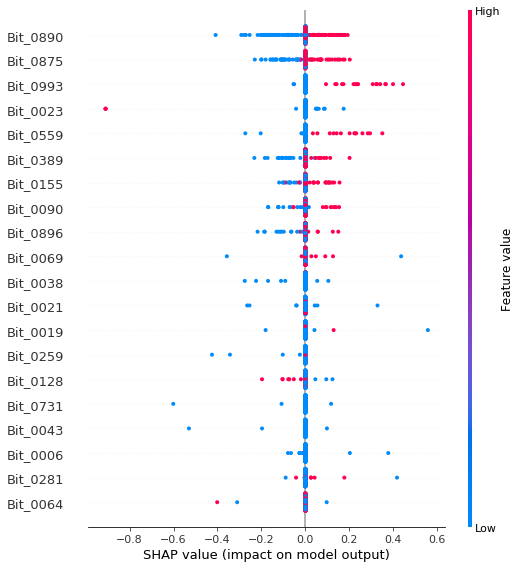

In [30]:
shap.summary_plot(shap_values, osm4_dataset_ecfp4.X)

## Visualize feature importance per sample

In [31]:
shap.force_plot(explainer.expected_value, shap_values, osm4_dataset_ecfp4.X)

## Visualize dependence of a feature to another

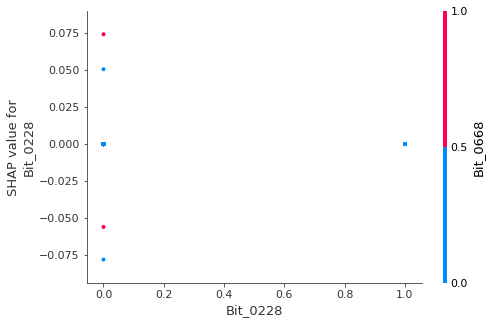

In [82]:
shap.dependence_plot("Bit_0228", shap_values, osm4_dataset_ecfp4.X)

# Test Set

Predict samples in test set

In [84]:
test_set = pd.read_excel('/mnt/data/OSM-S4/Round 2 Test Set.xlsx')
test_set.shape

(34, 5)

In [85]:
test_set.set_index('OSM Code', inplace=True)

## Calculate Molecular Descriptors

- Calculate descriptors
- Select only those used by model

In [86]:
test_set = pd.read_excel('/mnt/data/OSM-S4/Round 2 Test Set.xlsx')
test_set.set_index('OSM Code', inplace=True)

n_bits = 1024
smiles = test_set["SMILES"]

descriptors_df = pd.DataFrame(columns=['Bit_%04d' % x for x in range(n_bits)],
                              index=smiles.index, dtype=int)
for i in range(len(smiles)):
    try:
        molecule = AllChem.MolFromSmiles(smiles.iloc[i])
        fingerprint = AllChem.GetMorganFingerprintAsBitVect(molecule, 4, nBits=n_bits)
        for j in range(n_bits):
            descriptors_df.iloc[i][j] = int(fingerprint.ToBitString()[j])
    except Exception:
        print("Error parsing molecule %s" % (smiles.index[i]))
    
X = descriptors_df

RDKit ERROR: [23:27:39] 
RDKit ERROR: 
RDKit ERROR: ****
RDKit ERROR: Pre-condition Violation
RDKit ERROR: getExplicitValence() called without call to calcExplicitValence()
RDKit ERROR: Violation occurred on line 196 in file /opt/conda/conda-bld/rdkit_1591936650064/work/Code/GraphMol/Atom.cpp
RDKit ERROR: Failed Expression: d_explicitValence > -1
RDKit ERROR: ****
RDKit ERROR: 
RDKit ERROR: [11:47:20] 
RDKit ERROR: 
RDKit ERROR: ****
RDKit ERROR: Pre-condition Violation
RDKit ERROR: getExplicitValence() called without call to calcExplicitValence()
RDKit ERROR: Violation occurred on line 196 in file /opt/conda/conda-bld/rdkit_1591936650064/work/Code/GraphMol/Atom.cpp
RDKit ERROR: Failed Expression: d_explicitValence > -1
RDKit ERROR: ****
RDKit ERROR: 
RDKit ERROR: [11:48:24] 
RDKit ERROR: 
RDKit ERROR: ****
RDKit ERROR: Pre-condition Violation
RDKit ERROR: getExplicitValence() called without call to calcExplicitValence()
RDKit ERROR: Violation occurred on line 196 in file /opt/conda/co

Error parsing molecule OSM-LO-1


## Apply OPLRAreg to TestSet

These predictions had a precision of 77% and MAE (pIC50)=0.567 on the test set

In [89]:
pred_IC50 = results_ecfp4.predict(X)
pred_IC50 = pd.DataFrame(pred_IC50)
pred_IC50.columns = ["pIC50"]
pred_IC50.index = X.index

pred_IC50['prediction (uM)'] = pred_IC50["pIC50"].apply(lambda x: math.pow(10, -x,)/(1e-6))
pred_IC50

arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


,pIC50,prediction (uM)
OSM Code,,
OSM-LO-1,NaN,NaN
OSM-S-690,5.451427,3.536498
OSM-LO-2,5.860145,1.379925
OSM-LO-7,6.092370,0.808407
OSM-LO-8,6.130580,0.740321
OSM-LO-6,6.664517,0.216513
OSM-LO-4,4.397940,40.000000
OSM-LO-5,6.040182,0.911629
OSM-LO-10,5.735942,1.836785
